In [1]:
import sys
sys.version
sys.executable

'/home/mike/anaconda3/bin/python'

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
#import imutils
import numpy as np
from lxml import etree

from os import listdir
from os.path import isfile, join
from datetime import datetime

import tensorflow as tf
from keras import backend as K

from keras.models import model_from_json
from keras import optimizers

from keras.preprocessing.image import img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import decode_predictions
from keras.applications.vgg16 import VGG16
from keras.preprocessing.image import ImageDataGenerator, load_img

Using TensorFlow backend.


In [3]:
import socket
hostname=socket.gethostname()

file="1135"
if hostname=="cellar2":
    SCENE_DIR="/media/winpart/drone/upairtag/"
    ANNO_DIR="/media/winpart/drone/labels/"
else:
    SCENE_DIR="/part/data/upairdrone/upairtag/"
    ANNO_DIR="/part/data/upairdrone/labels/"
    
    
scenefile=join(SCENE_DIR,file+".jpg")

## VGG16 GAP model

In [4]:
modeldir="./"
model_json=join(modeldir,"vgg16-GAP.v3_arch.json")
model_weight=join(modeldir,"vgg16-GAP.v3weights.h5")

In [5]:
# Model reconstruction from JSON file
with open(model_json, 'r') as f:
    model = model_from_json(f.read())

model.load_weights(model_weight)

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),
              metrics=['accuracy'])

## VGG16 Classifier model

In [6]:
model_json=join(modeldir,"vgg16-fc1-fc2-12_arch.json")
model_weight=join(modeldir,"vgg16_weights.h5")

In [7]:
# Model reconstruction from JSON file
with open(model_json, 'r') as f:
    vggmodel = model_from_json(f.read())

vggmodel.load_weights(model_weight)

# Compile the model
vggmodel.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-5),
              metrics=['accuracy'])

In [8]:
from matplotlib.pyplot import figure

def show_rgb_equalized(image):
    h,w,c=image.shape
    if h*w>140000:
        figure(num=None, figsize=(12, 9), dpi=80, facecolor='w', edgecolor='k')
        
    channels = cv2.split(image)
    eq_channels = []
    for ch, color in zip(channels, ['R', 'G', 'B']):
        eq_channels.append(cv2.equalizeHist(ch))

    eq_image = cv2.merge(eq_channels)
    plt.imshow(eq_image)
    plt.show()

def show_rgb(image):
    h,w,c=image.shape
    if h*w>140000:
        figure(num=None, figsize=(12, 9), dpi=80, facecolor='w', edgecolor='k')
        
    plt.imshow(image)
    plt.show()    

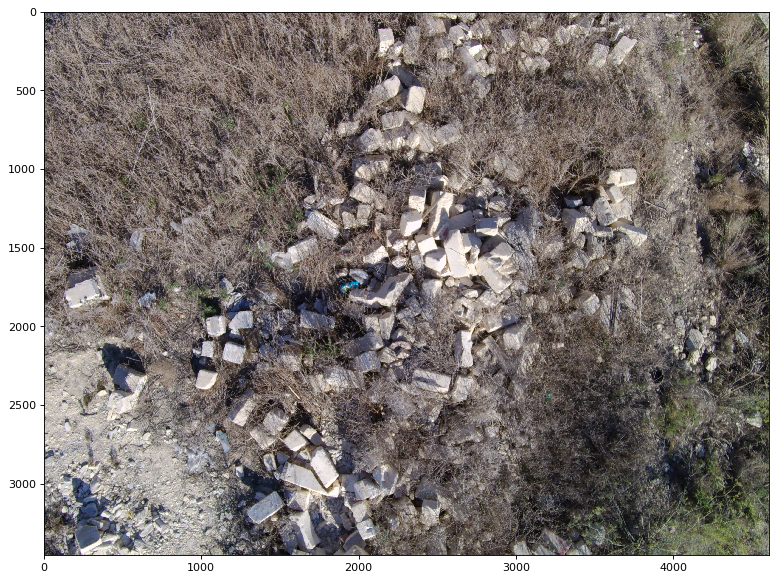

In [9]:
fullimage = cv2.imread(scenefile)
fullimage = cv2.cvtColor(fullimage, cv2.COLOR_BGR2RGB)

show_rgb(fullimage)

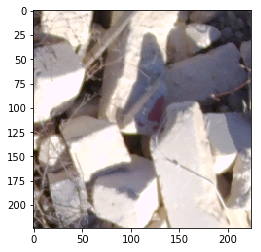

Image contained litter =  True


In [10]:
crop_image_size=448
image_size=224
x=2300
y=1200
crop_image=fullimage[y:y+crop_image_size,x:x+crop_image_size]
crop_image = cv2.resize(crop_image, (image_size, image_size))

#crop_image = crop_image.astype("float") / 255.0
img = img_to_array(crop_image.astype("float") / 255.0)
exp_img = np.expand_dims(img, axis=0)

show_rgb(crop_image)
preds=model.predict(exp_img)
print("Image contained litter = ",preds[0][1]>0.5)

## CAM methods

In [11]:
for i in model.layers:
    if i.name=="conv6":
        output=i.output
    if i.name=="batch_normalization_11":
        classw=i.get_weights()[0]

get_output = K.function([model.input], [output, model.layers[-1].output])

def cam(img_in,crop_image,model):
    
    exp_img=img_in.copy()
    
    [conv_output,preds]=get_output([exp_img])
    print("Prediction Accuracy ",preds)
    
    cam = np.zeros(dtype = np.float32, shape = conv_output.shape[1:3])
    for i, w in enumerate(classw[:]):
        cam+=w*conv_output[0,:,:,i]

    print("Maximum value in heatmap ",np.max(cam))
    cam /=np.max(cam)
    
    width=height=image_size
    cam = cv2.resize(cam, (height, width))
    image = crop_image.copy()
    heatmap = np.ones((height,width,3), np.uint8)*255
    heatmap[np.where(cam < 0.8)] = 0
    
    thresh = cv2.threshold(cv2.cvtColor(heatmap, cv2.COLOR_BGR2GRAY), 60, 255, cv2.THRESH_BINARY)[1]
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[1] 
    
    # loop over the contours
    for c in cnts:
        # compute the center of the contour
        M = cv2.moments(c)
        cX = int(M["m10"] / M["m00"])
        cY = int(M["m01"] / M["m00"])
        
        dist=0
        for [a] in c:
            dist=max(dist,(a[0]-cX)**2+(a[1]-cY)**2)
            
        radius=int(dist**0.5)
        # draw the contour and center of the shape on the image
        #cv2.drawContours(image, [c], -1, (0, 255, 0), 1)
        cv2.circle(image, (cX, cY), radius, (0, 255, 0), 2)
        cv2.circle(image, (cX, cY), 7, (255, 255, 255), -1)
        

    plt.imshow(image)
    plt.show()
        
def cam_centres(img_in,model,tilex,tiley):
    exp_img=img_in.copy()
    [conv_output,preds]=get_output([exp_img])
        
    cam = np.zeros(dtype = np.float32, shape = conv_output.shape[1:3])
    for i, w in enumerate(classw[:]):
        cam+=w*conv_output[0,:,:,i]

    cam /=np.max(cam)
    
    width=height=image_size
    cam = cv2.resize(cam, (height, width))
    heatmap = np.ones((height,width,3), np.uint8)*255
    heatmap[np.where(cam < 0.8)] = 0
    
    thresh = cv2.threshold(cv2.cvtColor(heatmap, cv2.COLOR_BGR2GRAY), 60, 255, cv2.THRESH_BINARY)[1]
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[1] 
    
    centres=[]
    # loop over the contours
    for c in cnts:
        # compute the center of the contour
        M = cv2.moments(c)
        cX = int(M["m10"] / M["m00"])
        cY = int(M["m01"] / M["m00"])
        
        dist=0
        for [a] in c:
            dist=max(dist,(a[0]-cX)**2+(a[1]-cY)**2)
            
        radius=int(dist**0.5)
        if radius>30:
            centres.append([cX*2+tilex,cY*2+tiley,radius,preds[0][1]])
    print(centres)
    return centres
    

In [12]:
def VGGaffine(sceneimage,cx,cy,show=False):
    
    height,width,chan = sceneimage.shape
    
    x1=max(0,cx-112)
    y1=max(0,cy-112)
    x2=min(x1+224,width)
    y2=min(y1+224,height)
    
    if (x2-x1)==224 and (y2-y1)==224:
        crop=sceneimage[y1:y2,x1:x2]
    elif (x2-x1)>40 and (y2-y1)>40:
        crop=cv2.resize(sceneimage[y1:y2,x1:x2],(224,224))
    else:
        return -1
    
    img = img_to_array(crop.astype("float") / 255.0)
    exp_img = np.expand_dims(img, axis=0)
    
    confidence=round(vggmodel.predict(exp_img)[0][1],3)
    
    if show==True:
        print(confidence)
        plt.imshow(crop)
        plt.show()
        
    return confidence

Prediction Accuracy  [[ 0.1622377   0.83776236]]
Maximum value in heatmap  60961.1


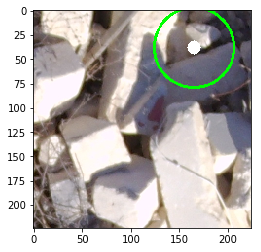

[[2630, 1276, 41, 0.83776236]]
0.0


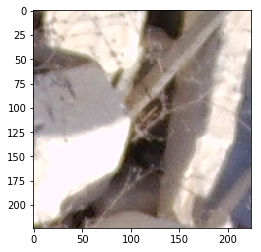

0.0

In [13]:
cam(exp_img,crop_image,model)
cam_centres(exp_img,model,2300,1200)
VGGaffine(fullimage,2418,1322,True)

In [14]:
crop_image_size=448
image_size=224
image_height,image_width,chan = fullimage.shape

In [15]:
def find_individual_intereset_tiles():
    for x in range(0,image_width,crop_image_size-150):
        for y in range(0,image_height,crop_image_size-150):

            crop_image=fullimage[y:y+crop_image_size,x:x+crop_image_size]

            crop_image = cv2.resize(crop_image, (image_size, image_size))
            img = img_to_array(crop_image.astype("float") / 255.0)
            exp_img = np.expand_dims(img, axis=0)

            preds=model.predict(exp_img)[0][1]

            if preds>0.7 :
                print(x,y)
                cam(exp_img,crop_image,model)
                
                for a in cam_centres(exp_img,model,x,y):
                    print("Affine Confidence :",VGGaffine(fullimage,a[0],a[1],True))
                    print("--------------------------")
                
#find_individual_intereset_tiles()

[[654, 1818, 46, 0.99181765]]
0.0


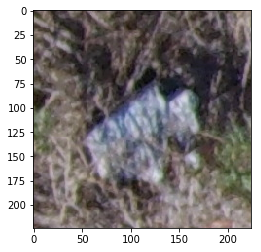

[[410, 2128, 33, 0.83081949]]
0.0


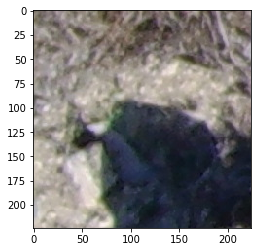

[[1034, 2318, 37, 0.91864473], [1224, 2168, 42, 0.91864473]]
0.002


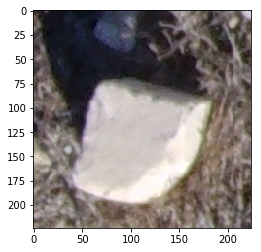

0.0


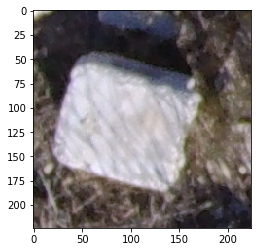

[[1166, 2648, 87, 0.87044519]]
0.0


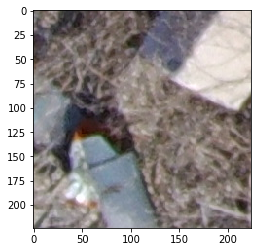

[[1648, 1474, 39, 0.71363598]]
0.0


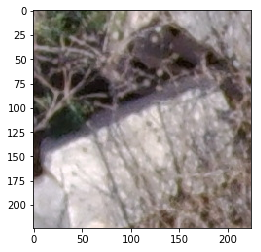

[[1780, 3244, 46, 0.81281787]]
0.0


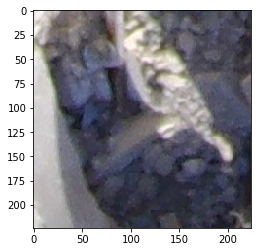

[[1812, 3352, 43, 0.99740547]]
0.0


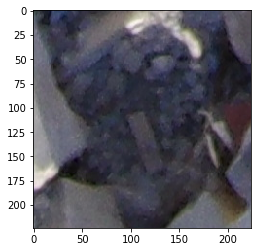

[[1946, 1732, 47, 0.99529856]]
1.0


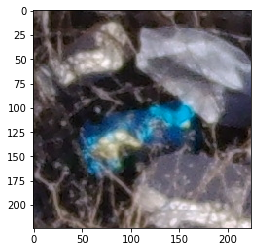

Litter found
[[1942, 3354, 84, 0.99801958]]
0.0


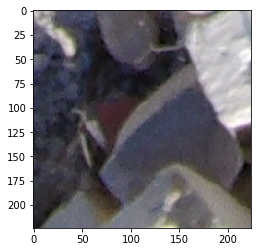

[[2344, 1790, 46, 0.91712934]]
0.017


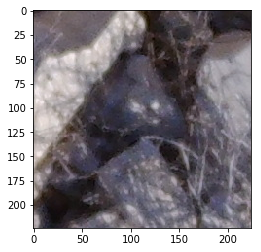

[[2566, 1184, 93, 0.97056311]]
0.0


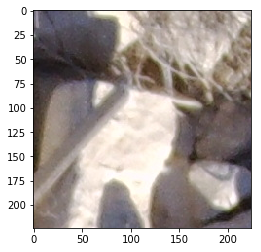

[[2670, 1272, 59, 0.9026252]]
0.0


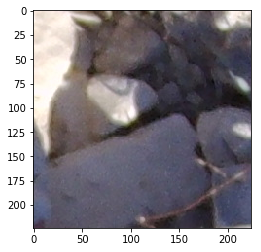

[[2888, 1352, 79, 0.83033198]]
0.0


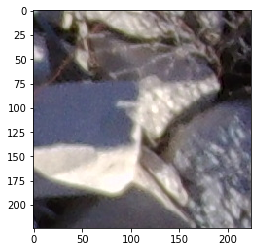

[[3212, 2428, 36, 0.99540979]]
1.0


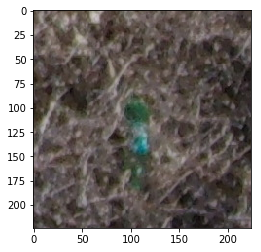

Litter found
[[3214, 2456, 38, 0.90553284]]
1.0


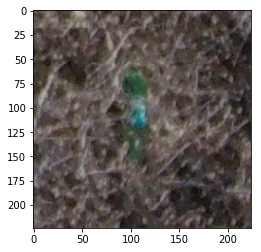

Litter found
[[3600, 1168, 44, 0.98762858]]
0.0


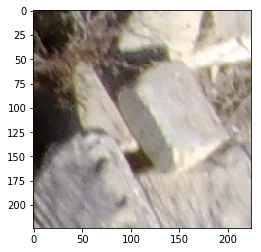

[[3752, 1386, 45, 0.77016157]]
0.0


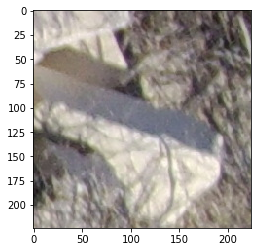

[[4162, 170, 38, 0.93256867]]
0.0


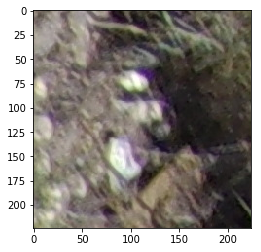

[[4030, 2780, 89, 0.96494603]]
1.0


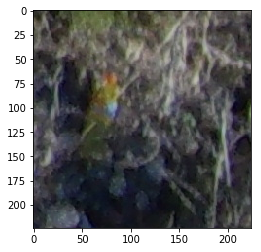

Litter found
[[4516, 924, 35, 0.89790124]]
0.0


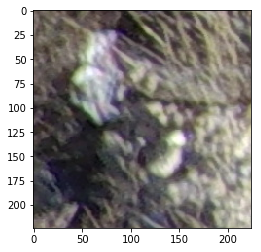

[[4478, 1038, 53, 0.88265616]]
0.959


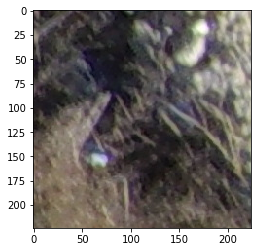

Litter found
[[4674, 942, 38, 0.9836691]]
0.0


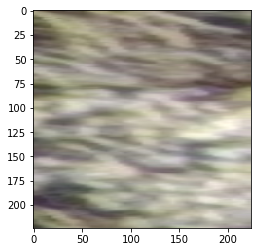

[[4670, 962, 41, 0.98573214]]
0.0


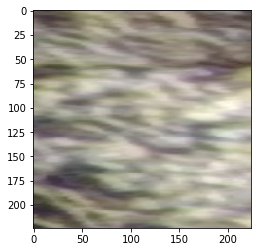

0:02:35.681590


In [16]:
start = datetime.now()
image_size=224


# Sliding Window with overlap
# Field Of View expanded from crop_image_size=448 tiles

def detect_litter(image,crop_image_size=448):
    bounding=[]
    image_height,image_width,chan = image.shape

    for x in range(0,image_width,crop_image_size-150):
        for y in range(0,image_height,crop_image_size-150):

            #Get Tile from Image
            crop_image=image[y:y+crop_image_size,x:x+crop_image_size]

            # Resize to 224x224
            crop_image = cv2.resize(crop_image, (image_size, image_size))
            img = img_to_array(crop_image.astype("float") / 255.0)
            exp_img = np.expand_dims(img, axis=0)

            # Get CAM prediction
            preds=model.predict(exp_img)[0][1]

            # If above Confidence Level 0.7
            if preds>0.7 :
                #Get contours
                centres=cam_centres(exp_img,model,x,y)
                for c in centres:
                    
                    if VGGaffine(image,c[0],c[1],True)>0.5:
                        print("Litter found")
                        bounding.append(c)
    last_centre=[]
    
    ## Non Maxima Suppression of intersecting circles
    ## Intersection is when distance between centres is less than radius of circles
    for index in range(len(bounding)):
        [x,y,r,c] = bounding[index]

        found=bounding[index]

        for index2 in range(len(bounding)):

            [x1,y1,r1,c1] = bounding[index2]

            ## if later confidence is larger than current confidence
            if c1>c and (((x1-x)**2)+((y1-y)**2)<r*r) and index!=index2:
                found=None # Remove centre from list

        if found!=None:
            last_centre.append(found)
            
    
    return last_centre

bounding = detect_litter(fullimage,448)
    
print(datetime.now()-start)

In [17]:
dispimage=fullimage.copy()
for c in bounding:
    [x,y,r,c] = c
    cv2.circle(dispimage,(x,y),r,(0,255,0),4)

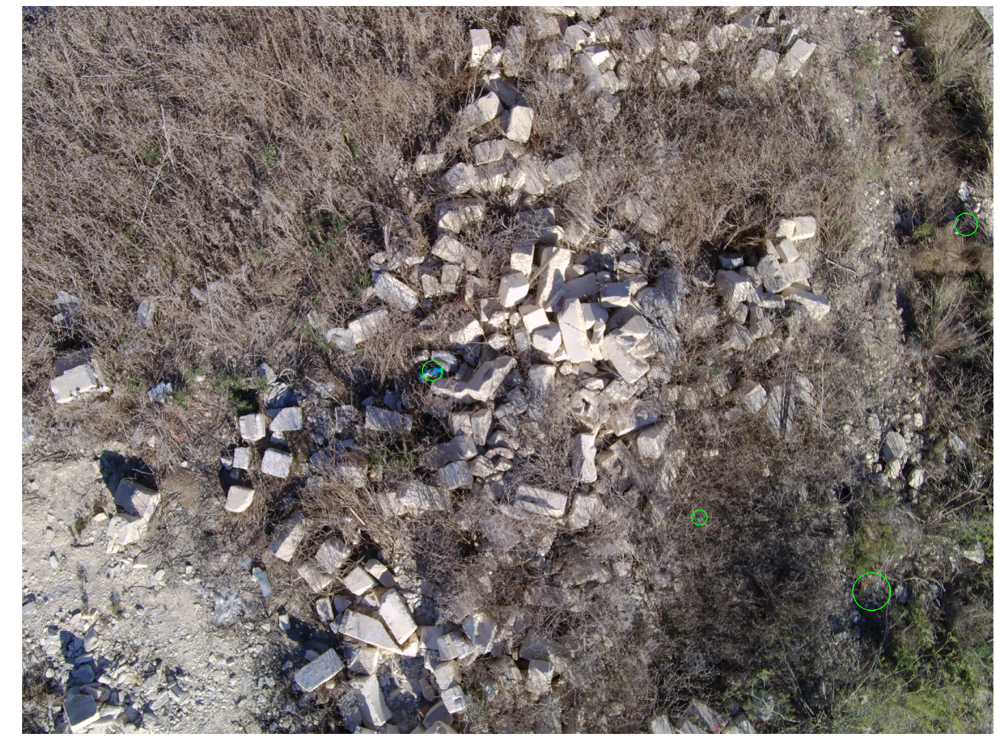

In [18]:
figure(num=None, figsize=(36, 24), dpi=80, facecolor='w', edgecolor='k')
plt.axis('off')
plt.imshow(dispimage)
plt.show()